# ELE510 Image Processing and Computer Vision: LAB, Exercise  3, Spatial-domain filters Part I. Linear Filtering.

**Purpose:** *To learn about Linear Filters and Local Image Features and its use in computer vision (image processing). Some basic experiments will be implemented using Pyhon, OpenCV and other packages.*

Read the text carefully before starting the work. In many cases it is necessary to do some preparations before you start the work on the computer. Read the necessary theory and answer the theoretical part first. The theoretical and experimental part should be solved individually. The notebook must be approved by the lecturer or the teaching assistants. 

The theory for this exercise can be found in chapter 5 of the text book [1]. See also the following documentations for help:
- [OpenCV](https://docs.opencv.org/4.8.0/d6/d00/tutorial_py_root.html)
- [numpy](https://numpy.org/doc/stable/)
- [matplotlib](https://matplotlib.org/stable/users/index.html)
- [scikit-image](https://scikit-image.org/)
- [scipy](https://scipy.org/)

<div class="alert alert-block alert-info">
Please, make sure that you have previously installed all the packages contained in the `requirements.txt` file.
</div>

**Approval:**
<div class="alert alert-block alert-success">
The current notebook should be submitted on CANVAS as a single PDF file. Read the `ELE510_Getting_started.pdf` file for more information.
</div>

## Note regarding the notebook

- You will find placeholders marked with `...` throughout the code. Your task is to replace each `...` with the appropriate code. Ensure that each placeholder is properly filled in to complete the implementation.

- The theoretical questions have to be answered directly on the notebook using the *Markdown* cells marked as **Answer here**. LaTex commands (if relevant) are available using the command `$...$`. You can also attach a scan (or an image) of the answer directly in the cell.

Possible ways to insert an image in the markdown cell:

`![image name]("image_path")`

`<img src="image_path" alt="Alt text" title="Title text" />`

## Problem 1

**a)** Briefly explain the following concepts: 
- Smoothing kernel
- Differentiating kernel
- Point Spread Function (PSF)
- Linear Shift-Invariant (LSI) system
- Finite Impulse Response (FIR) system
- Infinite Impulse Response (IIR) system

Smoothing Kernel : A kernel or a filter that reduces the noise in an image by averaging a pixel's neighboring pixels.

Differentiating Kernel : I highlights or makes the changes in an image much more visible, used for edge detection mostly.

Point Spread Function : Its a function that tells us how light spreads and blurs out the edges in the imaging devices. 

Linear shift-invariant : Changes in input = changes in output 

Finite Impluse Response : the input is finite, lets say a kernel is of finite in length.

Infinite Impulse Response : A system where impulse respose is infinte, I am guessing where the processes run indefinately or the input is continous. Rare for image processing. 

**b)** One of the most common applications in spatial-domain filtering is smoothing. The simplest smoothing kernel is the box or mean filter, in which every element of the kernel has the same value. On the other hand, a Gaussian kernel gives less weight to pixels further from the center of the window.

In this problem we want to study the use of a box filter of size 7 and some Gaussian filters with different standard deviations, $\sigma$, and different kernel sizes, $K \times K$ for smoothing. 
The Gaussian filter kernel (mask) is found by using the OpenCV function `cv2.getGaussianKernel()` ([Documentation](https://docs.opencv.org/2.4/modules/imgproc/doc/filtering.html#Mat%20getGaussianKernel(int%20ksize,%20double%20sigma,%20int%20ktype))). 
Start by finding filter masks as follows

**g1**: $\sigma = 0.5$, $K = 5$

**g2**: $\sigma = 1.0$, $K = 9$

**g3**: $\sigma = 1.5$, $K = 13$

Remember that it is important to select a proper kernel size given $\sigma$. If $\sigma$ is too large and the support (kernel) too small, the Gaussian filter will look almost like a box filter.

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import cv2

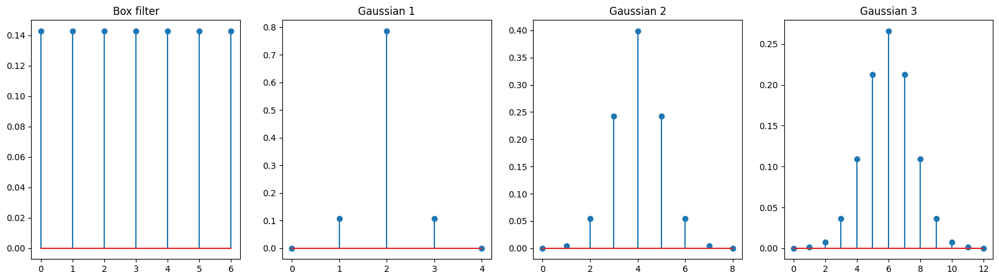

In [2]:
# Box filter of size 7
b1 = np.ones(7) / 7

# Gaussian filters
g1 =  cv2.getGaussianKernel(5, 0.5)
g2 =  cv2.getGaussianKernel(9, 1.0)
g3 =  cv2.getGaussianKernel(13, 1.5)

plt.figure(figsize=(20,5))

plt.subplot(1,4,1)
plt.stem(b1)
plt.title("Box filter")

plt.subplot(1,4,2)
plt.stem(g1)
plt.title("Gaussian 1")

plt.subplot(1,4,3)
plt.stem(g2)
plt.title("Gaussian 2")

plt.subplot(1,4,4)
plt.stem(g3)
plt.title("Gaussian 3")
plt.show()

**c)** In this exercise, we want to study how two well-known filters perform on noise removal considering Gaussian noise and salt-and-pepper noise. To do so, we will convolve the previously defined kernels with a noisy image. 

Convolution can be implemented in several ways (as shown later in this LAB). In this case, we will use `cv2.filter2D` function ([Documentation](https://docs.opencv.org/4.5.3/d4/d86/group__imgproc__filter.html#ga27c049795ce870216ddfb366086b5a04)). This function requires a 2D filter, obtained by multiplying the 1D filter for its transpose.

For generating the noise, we will use the package `scikit-image`.

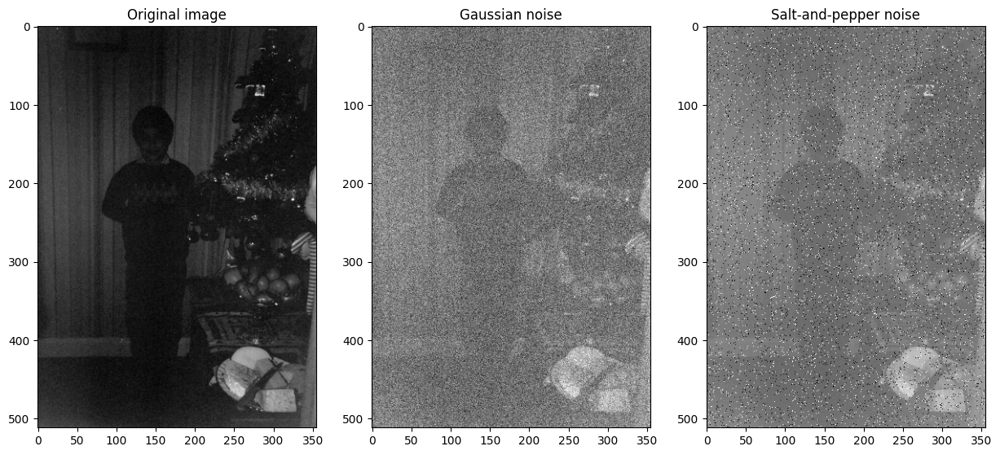

In [3]:
import cv2
from skimage.util import random_noise

# Read the image in grayscale
Im = cv2.imread("./images/christmas.png", cv2.IMREAD_GRAYSCALE)

# Add noise
Im_gauss = random_noise(Im, mode='gaussian', mean=0.0, var=0.01) # Gaussian white noise with 0 mean and variance of 0.01 
Im_SP = random_noise(Im, mode='s&p', amount=0.05)  # Salt and pepper noise on 5% of the pixels

# Show images
plt.figure(figsize=(15,15))
plt.subplot(131), plt.imshow(Im, cmap='gray')
plt.title('Original image')
plt.subplot(132), plt.imshow(Im_gauss, cmap='gray')
plt.title('Gaussian noise')
plt.subplot(133), plt.imshow(Im_SP, cmap='gray')
plt.title('Salt-and-pepper noise')
plt.show()

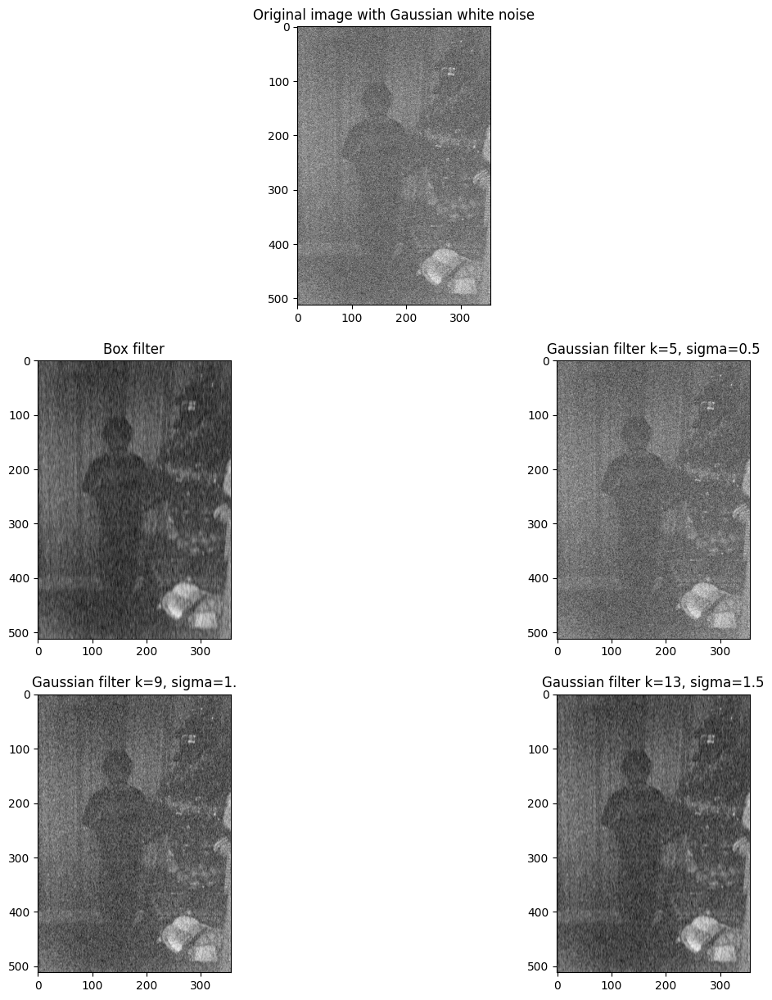

In [18]:
# Filtering Gaussian noise
Im_gauss_b1 = cv2.filter2D(Im_gauss, -1, b1)
Im_gauss_g1 = cv2.filter2D(Im_gauss, -1, g1) 
Im_gauss_g2 = cv2.filter2D(Im_gauss, -1, g2)  
Im_gauss_g3 = cv2.filter2D(Im_gauss, -1, g3)  

# Show results
plt.figure(figsize=(15,15))
plt.subplot(3,2,(1,2)), plt.imshow(Im_gauss, cmap='gray')
plt.title("Original image with Gaussian white noise")
plt.subplot(323), plt.imshow(Im_gauss_b1, cmap='gray')
plt.title('Box filter')
plt.subplot(324), plt.imshow(Im_gauss_g1, cmap='gray')
plt.title('Gaussian filter k=5, sigma=0.5')
plt.subplot(325), plt.imshow(Im_gauss_g2, cmap='gray')
plt.title('Gaussian filter k=9, sigma=1.')
plt.subplot(326), plt.imshow(Im_gauss_g3, cmap='gray')
plt.title('Gaussian filter k=13, sigma=1.5')
plt.show()

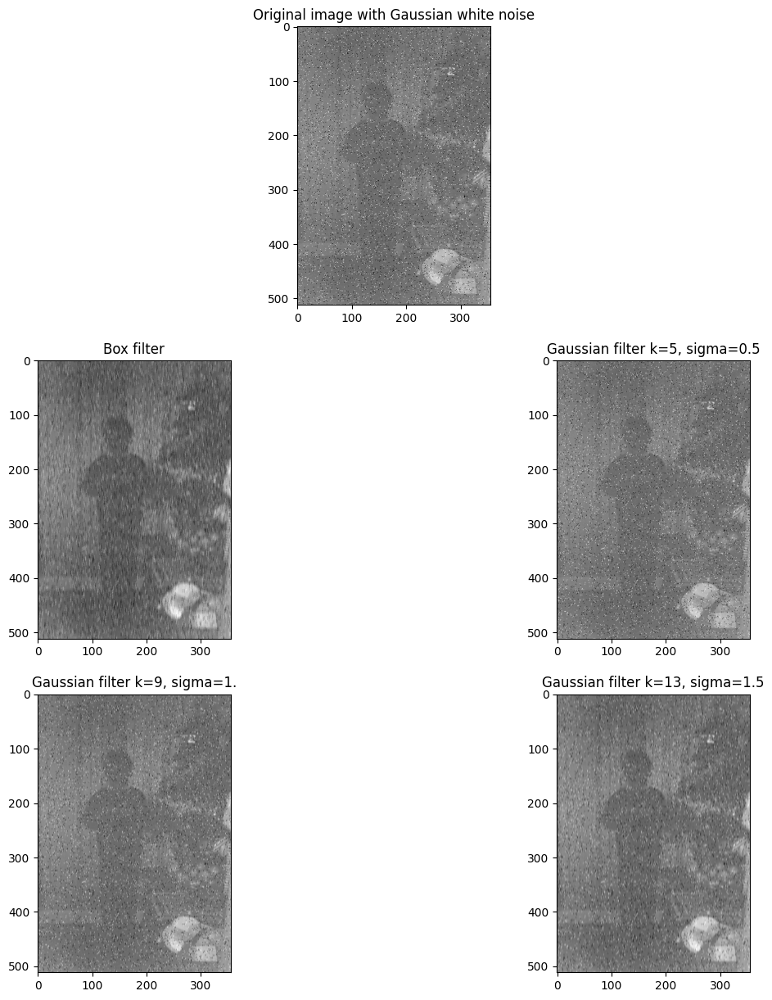

In [19]:
# Filtering S&P noise
Im_sp_b1 = cv2.filter2D(Im_SP, -1, b1)
Im_sp_g1 = cv2.filter2D(Im_SP, -1, g1)
Im_sp_g2 = cv2.filter2D(Im_SP, -1, g2)
Im_sp_g3 = cv2.filter2D(Im_SP, -1, g3)


# Show results
plt.figure(figsize=(15,15))
plt.subplot(3,2,(1,2)), plt.imshow(Im_SP, cmap='gray')
plt.title("Original image with Gaussian white noise")
plt.subplot(323), plt.imshow(Im_sp_b1, cmap='gray')
plt.title('Box filter')
plt.subplot(324), plt.imshow(Im_sp_g1, cmap='gray')
plt.title('Gaussian filter k=5, sigma=0.5')
plt.subplot(325), plt.imshow(Im_sp_g2, cmap='gray')
plt.title('Gaussian filter k=9, sigma=1.')
plt.subplot(326), plt.imshow(Im_sp_g3, cmap='gray')
plt.title('Gaussian filter k=13, sigma=1.5')
plt.show()

d) Both are pretty terrible but gausian seems to keep the quality of the image.

## Problem 2

In this problem we want to get a better understanding of linear filtering using convolution. 

In [6]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt 

**a)** **Prewitt** and **Sobel** masks are used to compute the two components of the gradient. Since it is convenient to smooth first before differentiation in order to reduce the noise in the image, they smooth by a 3-pixel smoothing filter in the horizontal (x) and vertical (y) direction, respectively, and differentiate over a 3-pixel region in the other direction. These masks represent separable 2D filters and can be separated into a smoothing and a differentiation 1D filters.

Build the Prewitt and Sobel masks for both axes, indicating the type of 1D filters convolved in each case.

**Answer here**

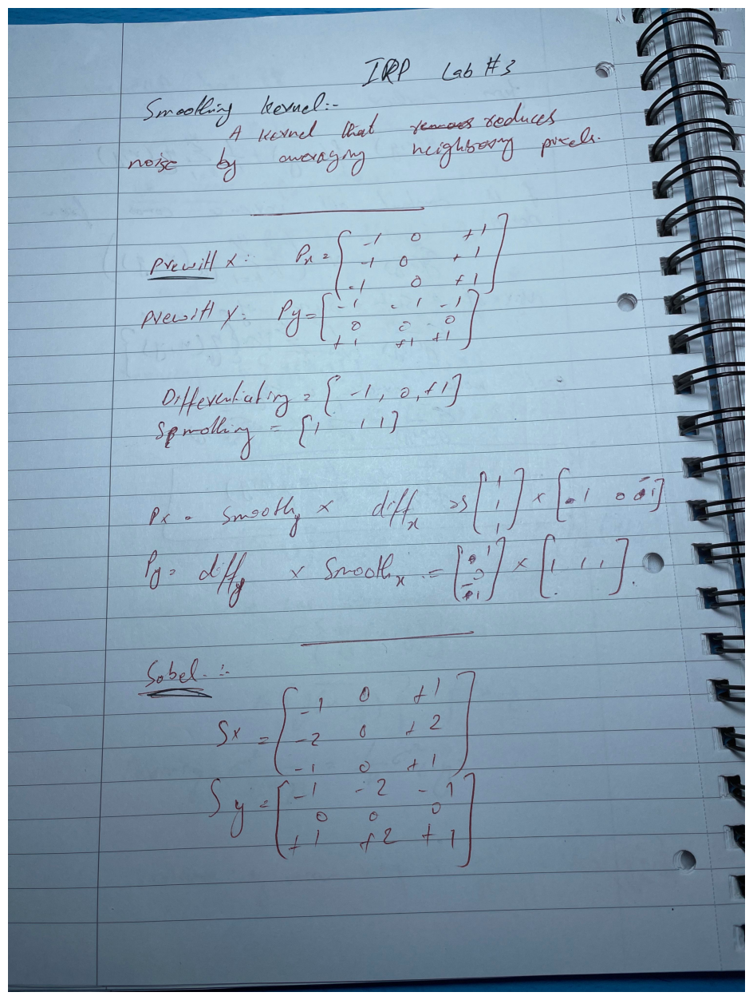

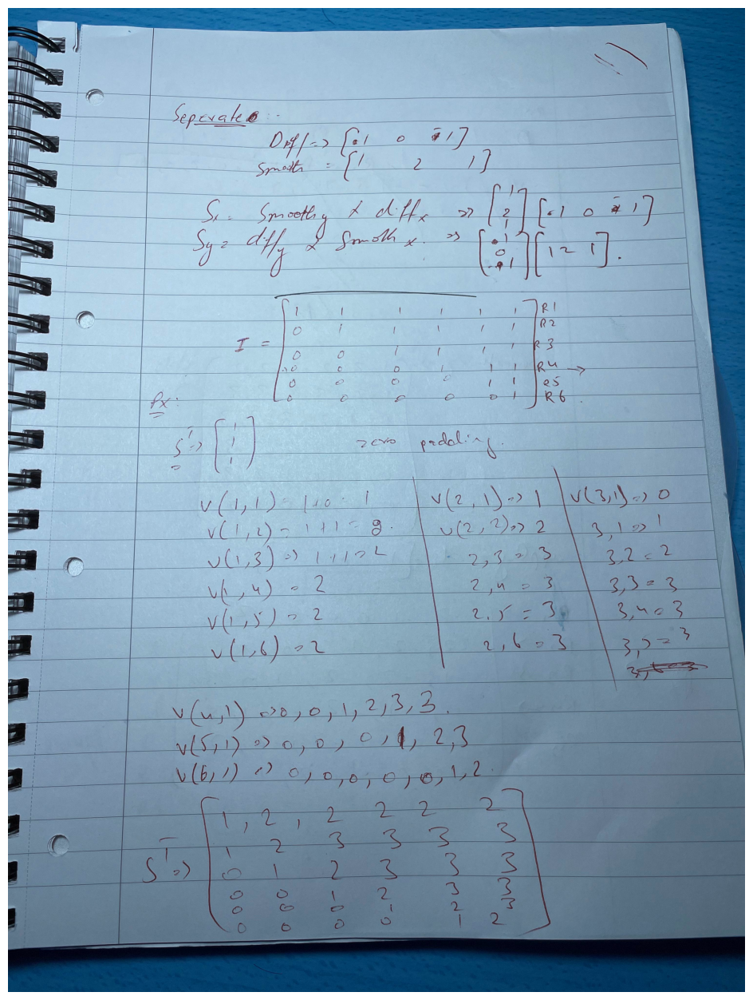

In [7]:
img1 = cv2.imread("./images/l3p1.jpg")
img2 = cv2.imread("./images/l3p2.jpg")
plt.figure(figsize=(16, 16))
plt.imshow(img1, cmap="gray")
plt.axis("off")
plt.show()
plt.figure(figsize=(16, 16))
plt.imshow(img2, cmap="gray")
plt.axis("off")
plt.show()

**b)** Consider the following image:

\begin{equation}
    {\mathbf Im} = \begin{bmatrix} 
    1 & 1 & 1 & 1 & 1 & 1 \\
    0 & 1 & 1 & 1 & 1 & 1 \\
    0 & 0 & 1 & 1 & 1 & 1 \\
    0 & 0 & 0 & 1 & 1 & 1 \\
    0 & 0 & 0 & 0 & 1 & 1 \\
    0 & 0 & 0 & 0 & 0 & 1 \end{bmatrix}
\end{equation}

Filter this image using the Prewitt and Sobel masks. Find the two output images representing the differential along the horizontal and vertical directions. **The computations have to be done by hand on paper (attached a picture for your solution)**. You can neglect the normalization coefficients ($\frac{1}{K}$).

**Hints**:
- For simplicity, you can separate the 2D convolution into two 1D convolutions.
- Remember to add padding to the original image of your choice (mirroring, zero-padding ...) before the convolution in order to keep the same image dimensions. Also, flip the kernel in both axes when applying convolution. For more information, check [this explanation](https://stackoverflow.com/questions/45152473/why-is-the-convolutional-filter-flipped-in-convolutional-neural-networks) and [this GUI example](http://195.134.76.37/applets/AppletConvol/Appl_Convol2.html)

**Answer here**

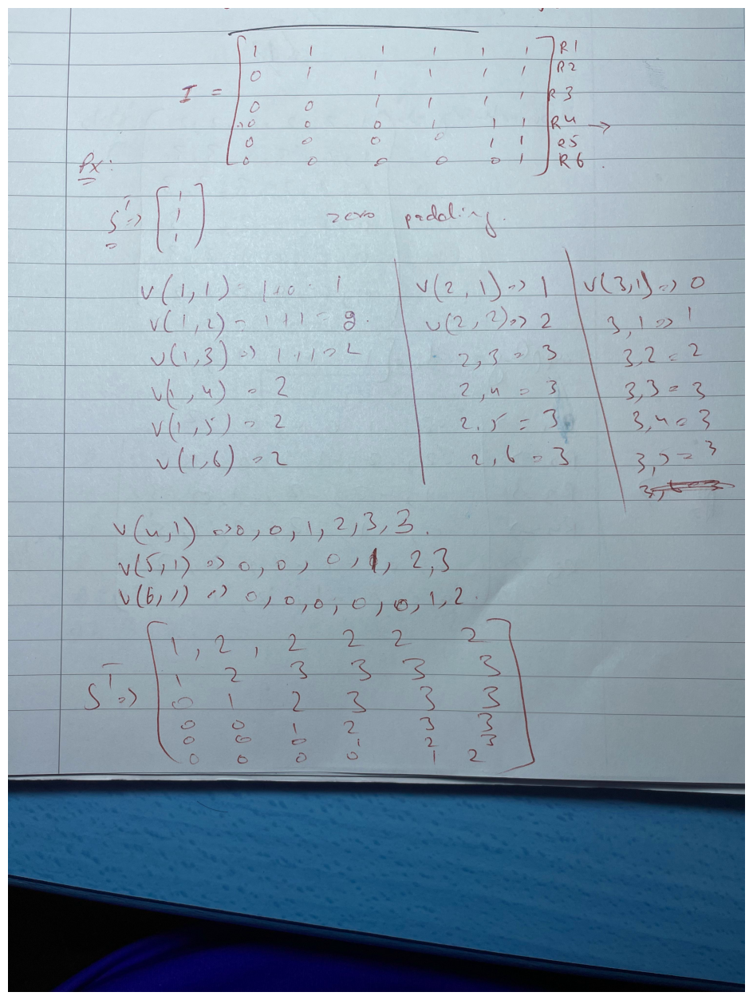

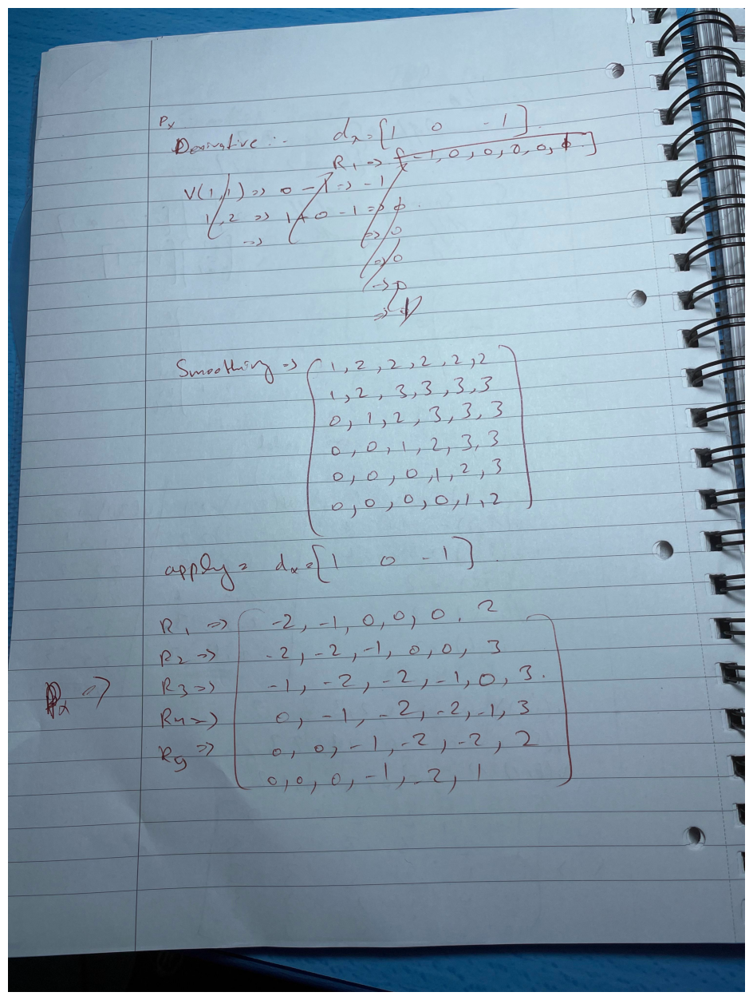

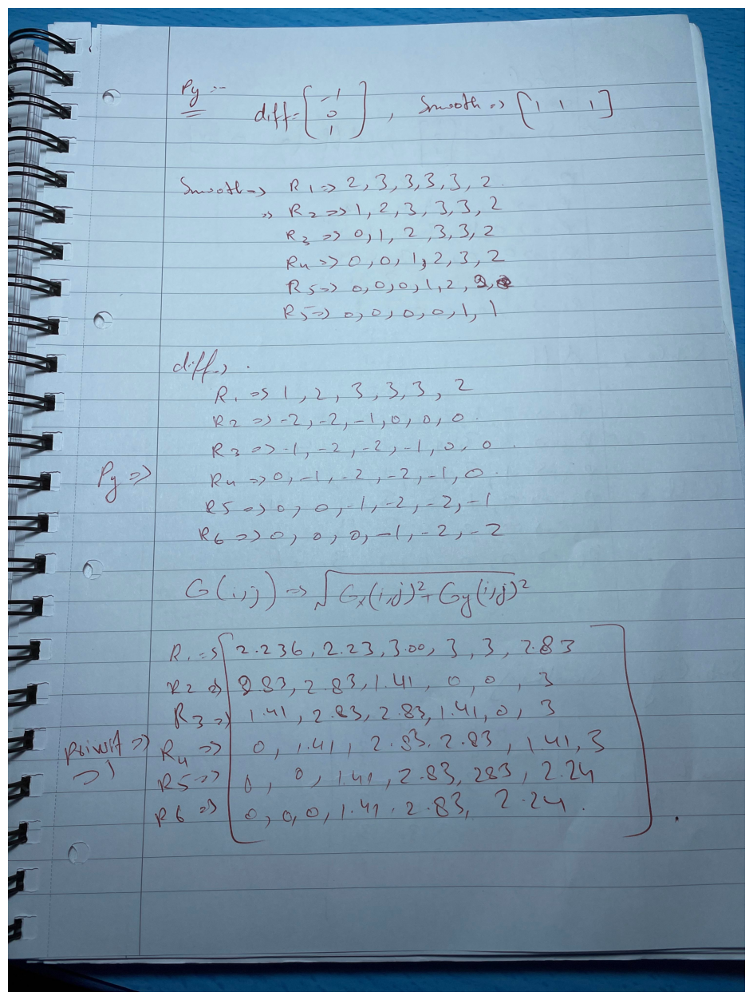

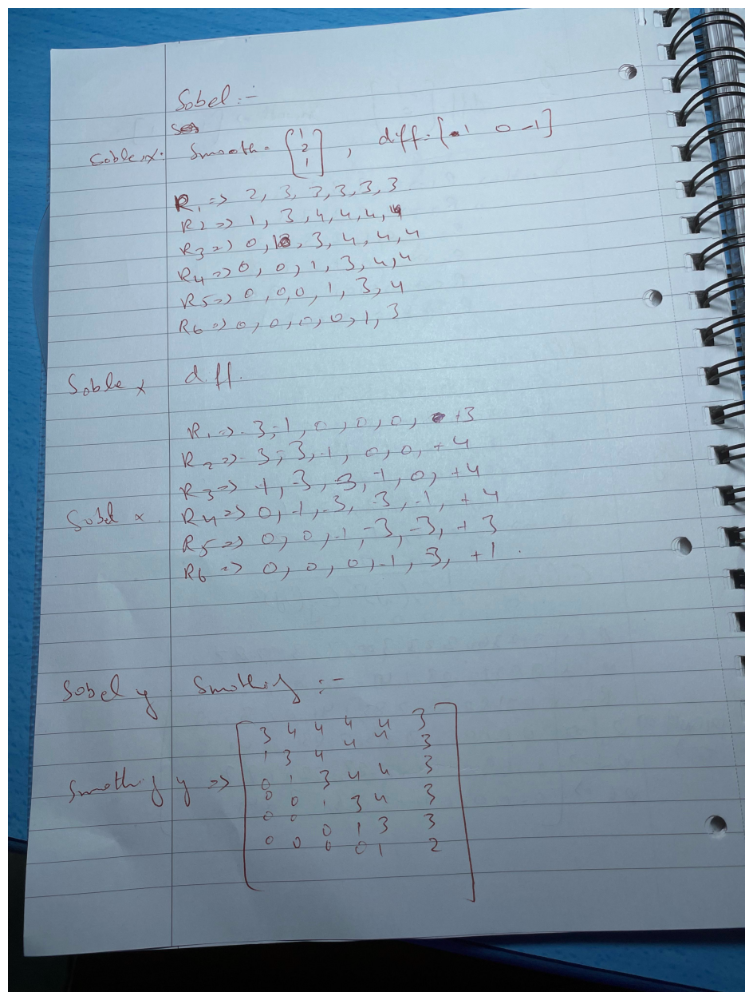

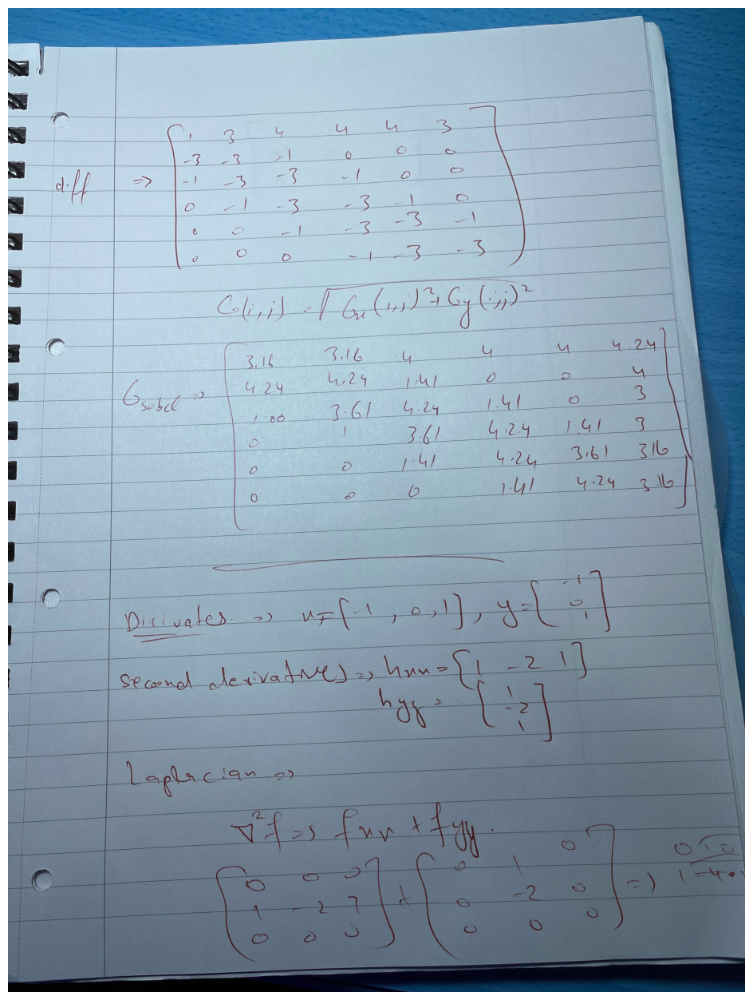

In [9]:
img1 = cv2.imread("./images/l3p3.jpg")
img2 = cv2.imread("./images/l3p4.jpg")
img3 = cv2.imread("./images/l3p5.jpg")
img4 = cv2.imread("./images/l3p6.jpg")
img5 = cv2.imread("./images/l3p7.jpg")
plt.figure(figsize=(16, 16))
plt.imshow(img1, cmap="gray")
plt.axis("off")
plt.show()
plt.figure(figsize=(16, 16))
plt.imshow(img2, cmap="gray")
plt.axis("off")
plt.show()
plt.figure(figsize=(16, 16))
plt.imshow(img3, cmap="gray")
plt.axis("off")
plt.show()
plt.figure(figsize=(16, 16))
plt.imshow(img4, cmap="gray")
plt.axis("off")
plt.show()
plt.figure(figsize=(16, 16))
plt.imshow(img5, cmap="gray")
plt.axis("off")
plt.show()

**c)** Check the results on the notebook using some of the pre-built functions. To do so, make use of the SciPy package, a library that provides fundamental algorithms for scientific computing in Python.

In particular, we will make use of the `sepfir2d()` ([Documentation](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.sepfir2d.html)) function, where you can apply 2D convolution with a sperarable FIR filter. As mentioned in the documentation, *mirror symmetric boundary conditions are assumed*.

Using SciPy, you do not need to flip the kernels to compute the convolution (other libraries do not flip the kernel automatically, like OpenCV).

In [10]:
# Import relevant libraries
from scipy import signal

# Image
img = np.array(
    [[1,1,1,1,1,1],
     [0,1,1,1,1,1],
     [0,0,1,1,1,1],
     [0,0,0,1,1,1],
     [0,0,0,0,1,1],
     [0,0,0,0,0,1]], dtype=np.float64)

Convolve the Image with Prewitt x
[[2. 1. 0. 0. 0. 0.]
 [3. 2. 1. 0. 0. 0.]
 [1. 2. 2. 1. 0. 0.]
 [0. 1. 2. 2. 1. 0.]
 [0. 0. 1. 2. 2. 1.]
 [0. 0. 0. 1. 1. 1.]]
Convolve the Image with Prewitt y
[[-1. -1.  0.  0.  0.  0.]
 [-1. -2. -1.  0.  0.  0.]
 [-1. -2. -2. -1.  0.  0.]
 [ 0. -1. -2. -2. -1.  0.]
 [ 0.  0. -1. -2. -2. -1.]
 [ 0.  0.  0. -1. -3. -2.]]


Text(0.5, 1.0, 'Prewitt Y')

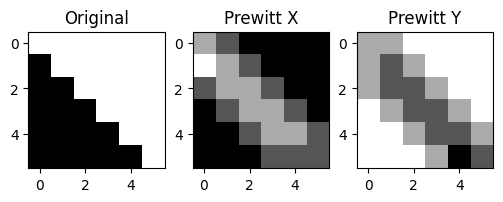

In [11]:
# Prewitt

# Separable FIR filter
h_p_diff = np.array([-1, 0, 1]) 
h_p_smooth = np.array([1, 1, 1])

# 2D Convolution
P_x = signal.sepfir2d(img, h_p_smooth, h_p_diff)
P_y = signal.sepfir2d(img, h_p_diff, h_p_smooth)

print("Convolve the Image with Prewitt x")
print(P_x)

print("Convolve the Image with Prewitt y")
print(P_y)

plt.figure(figsize=(6,8))
plt.subplot(131)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.subplot(132)
plt.imshow(P_x, cmap='gray')
plt.title('Prewitt X')
plt.subplot(133)
plt.imshow(P_y, cmap='gray')
plt.title('Prewitt Y')

Convolve the Image with Sobel x
[[3. 1. 0. 0. 0. 0.]
 [4. 3. 1. 0. 0. 0.]
 [1. 3. 3. 1. 0. 0.]
 [0. 1. 3. 3. 1. 0.]
 [0. 0. 1. 3. 3. 1.]
 [0. 0. 0. 1. 2. 1.]]
Convolve the Image with Sobel y
[[-1. -1.  0.  0.  0.  0.]
 [-2. -3. -1.  0.  0.  0.]
 [-1. -3. -3. -1.  0.  0.]
 [ 0. -1. -3. -3. -1.  0.]
 [ 0.  0. -1. -3. -3. -1.]
 [ 0.  0.  0. -1. -4. -3.]]


Text(0.5, 1.0, 'Sobel Y')

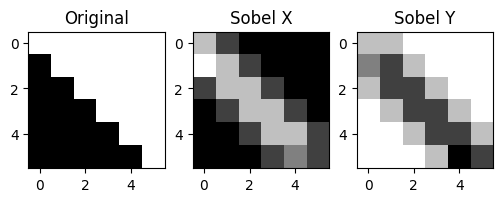

In [12]:
# Sobel

# Separable FIR filter
h_s_diff =  np.array([-1, 0, 1])
h_s_smooth = np.array([1, 2, 1])  

# 2D Convolution
S_x = signal.sepfir2d(img, h_s_smooth, h_s_diff)
S_y = signal.sepfir2d(img, h_s_diff, h_s_smooth)

print("Convolve the Image with Sobel x")
print(S_x)

print("Convolve the Image with Sobel y")
print(S_y)

plt.figure(figsize=(6,8))
plt.subplot(131)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.subplot(132)
plt.imshow(S_x, cmap='gray')
plt.title('Sobel X')
plt.subplot(133)
plt.imshow(S_y, cmap='gray')
plt.title('Sobel Y')

## Problem 3

Given the previous test image, we will aim to detect the possible edges in the image in this exercise. 

We will make use of the `signal.convolve2d` function ([Documentation](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve2d.html)) to perform a convolutional operation on an image using a specific 2D mask.

**a)** With gradients, we can analyze where those changes are generated and, thus, detect where possible edges can be. Compute the maginitud of the gradients, $|\nabla I| = \|\nabla I\| = \sqrt{I_{x}^{2}(m,n)+I_{y}^{2}(m,n)}$, based on the **Prewitt** and **Sobel** masks.

In [13]:
# Estimate the gradient
def gradient(I_x, I_y):
        
    grad = np.sqrt(I_x**2 + I_y**2)
    
    return grad

In [14]:
# Prewitt
H_p_x = np.array([[-1, 0, 1],
                  [-1, 0, 1],
                  [-1, 0, 1]], dtype=np.float64)

H_p_y = H_p_x.T # Transpose H_p_x

I_x = signal.convolve2d(img, H_p_x, mode='same', boundary='symm')
I_y = signal.convolve2d(img, H_p_y, mode='same', boundary='symm')

grad_prewitt = gradient(I_x, I_y)

In [15]:
# Sobel
H_s_x = np.array([[-1, 0, 1],
                  [-2, 0, 2],
                  [-1, 0, 1]], dtype=np.float64)

H_s_y = H_s_x.T # Transpose H_p_x

I_x = signal.convolve2d(img, H_s_x, mode='same', boundary='symm')
I_y = signal.convolve2d(img, H_s_y, mode='same', boundary='symm')

grad_sobel = gradient(I_x, I_y)

Gradient based on Prewitt: 
 [[2.23606798 1.41421356 0.         0.         0.         0.        ]
 [3.16227766 2.82842712 1.41421356 0.         0.         0.        ]
 [1.41421356 2.82842712 2.82842712 1.41421356 0.         0.        ]
 [0.         1.41421356 2.82842712 2.82842712 1.41421356 0.        ]
 [0.         0.         1.41421356 2.82842712 2.82842712 1.41421356]
 [0.         0.         0.         1.41421356 3.16227766 2.23606798]]
Gradient based on Sobel: 
 [[3.16227766 1.41421356 0.         0.         0.         0.        ]
 [4.47213595 4.24264069 1.41421356 0.         0.         0.        ]
 [1.41421356 4.24264069 4.24264069 1.41421356 0.         0.        ]
 [0.         1.41421356 4.24264069 4.24264069 1.41421356 0.        ]
 [0.         0.         1.41421356 4.24264069 4.24264069 1.41421356]
 [0.         0.         0.         1.41421356 4.47213595 3.16227766]]


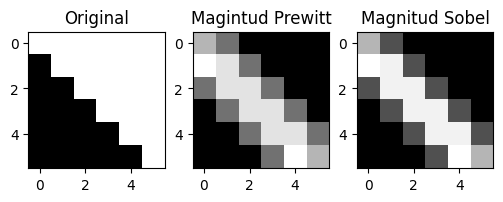

In [16]:
print("Gradient based on Prewitt: \n", grad_prewitt)
print("Gradient based on Sobel: \n", grad_sobel)

plt.figure(figsize=(6,8))
plt.subplot(131)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.subplot(132)
plt.imshow(grad_prewitt, cmap='gray')
plt.title('Magintud Prewitt')
plt.subplot(133)
plt.imshow(grad_sobel, cmap='gray')
plt.title('Magnitud Sobel')
plt.show()

**b)** Peaks or valleys of the first derivative of the image correspond to “zero-crossings” of the second derivative. Just as the finite difference operator approximates the first derivative, the difference between differences approximates the second derivative. It can be better at localizing edges but is more sensitive to noise.

Obtain (by hand) the simplest Laplacian kernel. This second derivative kernel involves no smoothing and is obtained by the sum of the horizontal and vertical second-derivative kernels (considered as the middle row and column, respectively, of a square matrix whose remaining elements are zero).

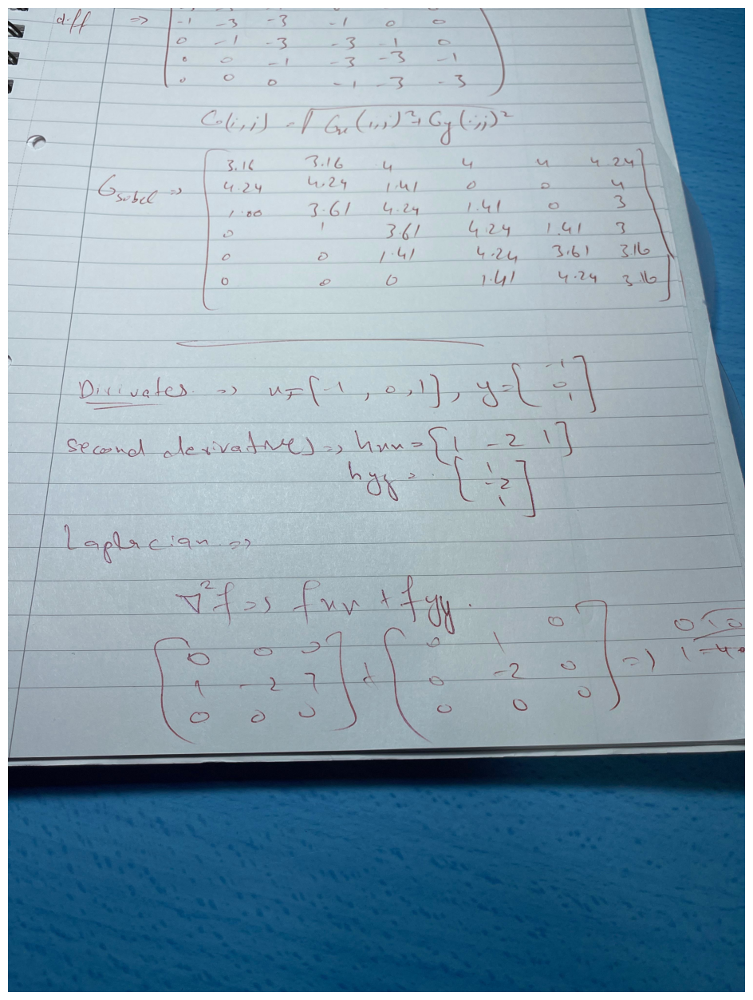

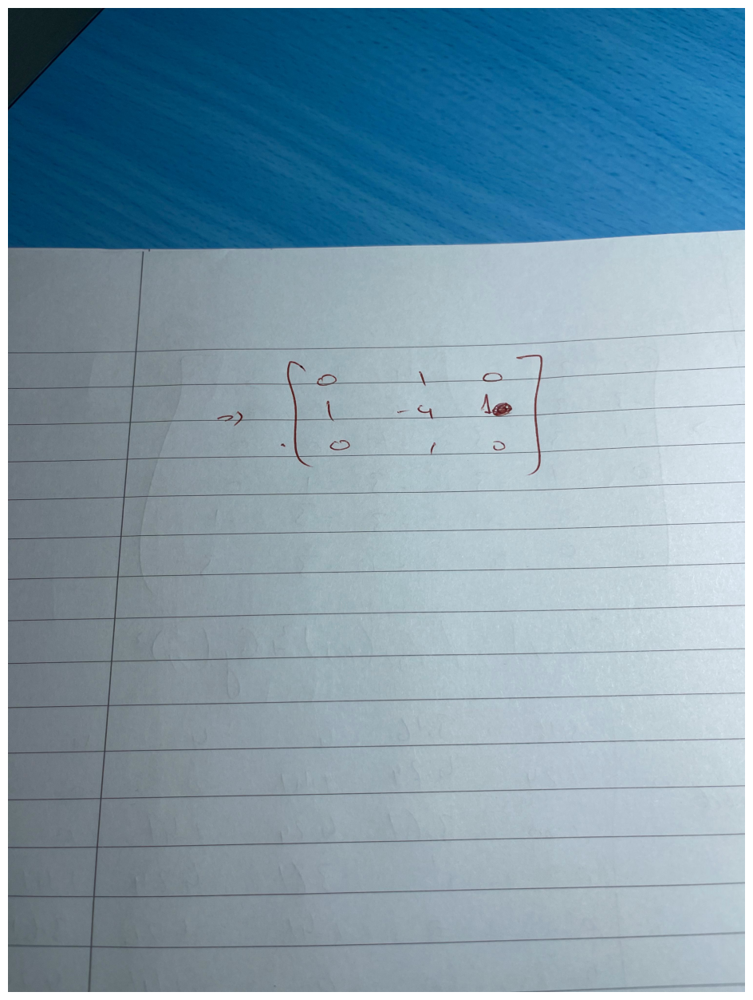

In [ ]:
img1 = cv2.imread("./images/l3p8.jpg")
img2 = cv2.imread("./images/l3p9.jpg")
plt.figure(figsize=(16, 16))
plt.imshow(img1, cmap="gray")
plt.axis("off")
plt.show()
plt.figure(figsize=(16, 16))
plt.imshow(img2, cmap="gray")
plt.axis("off")
plt.show()

**c)** Sketch the Laplacian of the test image using the mask in the previous equation. Compare the results with the resulting mask for computation of the Laplacian if the Prewitt masks are used for computation of the differentials, and with the resulting mask from the built-in cv2 <code>cv2.Laplacian(I, -1, ksize=5)</code> function (<a href="https://docs.opencv.org/4.5.3/d4/d86/group__imgproc__filter.html#gad78703e4c8fe703d479c1860d76429e6">Documentation</a>) where <code>I</code> is the test image and <code>ksize</code> is the aperture size used to compute the second-derivative filters.

**Hint.** To get the Prewitt second derivative, convolve each Prewitt mask with itself `h_xx = signal.convolve2d(h_x, h_x)`.

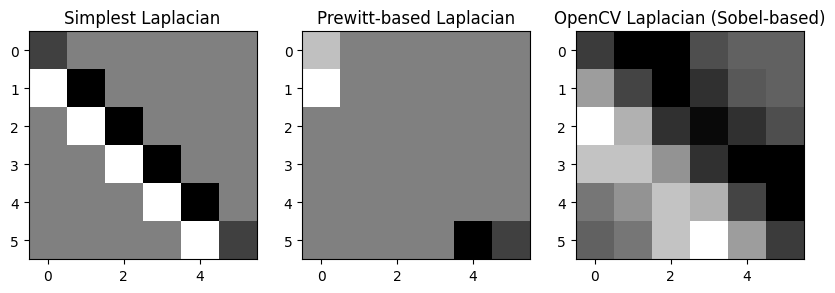

In [17]:
# Simplest Laplacian
h_L_1 = np.array([[0,1,0],
                  [1,-4,1],
                  [0,1,0]], dtype=np.float64)

L1 = signal.convolve2d(img, h_L_1, mode="same", boundary="symm")

# Prewitt-based
H_p_xx = np.array([[-1,0,1],
                  [-1,0,1],
                  [-1,0,1]], dtype=np.float64)
H_p_yy = H_p_x.T


h_L_2 = H_p_xx + H_p_yy

L2 = signal.convolve2d(img, h_L_2, mode="same", boundary="symm")

# OpenCV
L3 = cv2.Laplacian(img.astype(np.float64), -1, ksize=5)

plt.figure(figsize=(10,10))
plt.subplot(131), plt.imshow(L1, cmap="gray"), plt.title("Simplest Laplacian")
plt.subplot(132), plt.imshow(L2, cmap="gray"), plt.title("Prewitt-based Laplacian")
plt.subplot(133), plt.imshow(L3, cmap="gray"), plt.title("OpenCV Laplacian (Sobel-based)")
plt.show()

## Contact
### Course teacher
Professor Kjersti Engan, room E-431,
E-mail: kjersti.engan@uis.no

### Teaching assistant
Md Sazidur Rahman, room E-401
E-mail: md.s.rahman@uis.no


## References

[1] S. Birchfeld, Image Processing and Analysis. Cengage Learning, 2016.

[2] I. Austvoll, "Machine/robot vision part I," University of Stavanger, 2018. Compendium, CANVAS.
